In [1]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import re
from nltk.probability import FreqDist
import matplotlib.cm as cm

from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [2]:
pd.set_option=("display.max_colwidth",'100')

df1=pd.read_csv("../ch_bug_data_new.csv")
df1.tail()

,Unnamed: 0,bug_id,priority,type,component,status,summary,owner,reporter,comp_id,component_new
99723,99723,987797,3.0,Bug,"UI>Accessibility, OS>Accessibility>ChromeVox",Fixed,[Compile Failure] Observing compile failure on...,nek...@chromium.org,pbomm...@chromium.org,202,os
99724,99724,987788,2.0,Bug,Mobile>WebView,Assigned,Change precedence for commandline/features to ...,ntfschr@chromium.org,ntfschr@chromium.org,212,mobile
99725,99725,987750,3.0,Bug,Blink>Paint,Available,Add a test of backdrop-filter with null (no) c...,NaN,a_deleted_user,188,blink
99726,99726,987730,2.0,Bug,Blink>Paint,Fixed,DL: beforeactivate commits DCHECK,vmp...@chromium.org,vmp...@chromium.org,188,blink
99727,99727,987686,3.0,Bug,Blink>WebOTP,Untriaged,Investigate what happens when chrome gets page...,goto@chromium.org,goto@chromium.org,188,blink


In [3]:
df2=df1.drop(['type','priority','status','owner','reporter'],axis=1)
df2['summary']=df2['summary'].str.lower()
df2.head()
df3=df2
df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui
...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink


In [6]:
#removing punctuations from the summary

import string

def remove_punctuation(txt):
    if isinstance(txt, str):
        txt_nopunt = "".join([c for c in txt if c not in string.punctuation])
        return txt_nopunt
    else:
        return txt
df3['msg_clean'] = df3['summary'].apply(lambda x: remove_punctuation(x))
df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable
...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck


In [7]:
import re

def tokenize(text):
    tokens=re.split('\W+',text)
    return tokens

#df3['summary_tokenized']=df3['msg_clean'].apply(lambda x: tokenize(x.lower()))
df3['summary_tokenized'] = df3['msg_clean'].apply(lambda x: tokenize(x.lower()) if isinstance(x, str) else [])

df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,..."
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,..."
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]"
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]"
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not..."
...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure..."
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,..."
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,..."
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]"


In [8]:
#importing nltk to remove stopwords from the summary_tokenized

import nltk
nltk.download('stopwords')
stopwords=nltk.corpus.stopwords.words('english')

def remove_stopwords(txt_tokenized):
    txt_clean=[word for word in txt_tokenized if word not in stopwords]
    return txt_clean


df3['no_swds']=df3['summary_tokenized'].apply(lambda x: remove_stopwords(x))
df3

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\yousu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,...","[mohnstrudel, a11y, keyboard, focus, ring, tab..."
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,...","[sheriffomatic, longer, show, m85, builders, ]"
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frames]"
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]","[add, chromeflags, entry, iph, snooze]"
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not...","[second, row, new, tab, page, buttons, clickable]"
...,...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure..."
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,...","[change, precedence, commandlinefeatures, alig..."
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,...","[add, test, backdropfilter, null, crop, rect]"
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]"


In [9]:
#Lemmatizing the no_swds column to get the root word 'Lemma' 


nltk.download('wordnet')
nltk.download('omw-1.4')
wn=nltk.WordNetLemmatizer()


def lemmatization(token_txt):
    text=[wn.lemmatize(word) for word in token_txt]
    return text

df3['lemmatized_wrds']=df3['no_swds'].apply(lambda x: lemmatization(x))
df3['lemmatized_str'] = df3['lemmatized_wrds'].apply(lambda x: ' '.join(x))
df3.head()

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\yousu\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\yousu\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds,lemmatized_wrds,lemmatized_str
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,...","[mohnstrudel, a11y, keyboard, focus, ring, tab...","[mohnstrudel, a11y, keyboard, focus, ring, tab...",mohnstrudel a11y keyboard focus ring tab count...
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,...","[sheriffomatic, longer, show, m85, builders, ]","[sheriffomatic, longer, show, m85, builder, ]",sheriffomatic longer show m85 builder
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frame]",fps meter isnt capturing dropped frame
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]","[add, chromeflags, entry, iph, snooze]","[add, chromeflags, entry, iph, snooze]",add chromeflags entry iph snooze
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not...","[second, row, new, tab, page, buttons, clickable]","[second, row, new, tab, page, button, clickable]",second row new tab page button clickable


In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=25, max_features=20000)
word_to_drop = ['firefox', 'doesnt', 'using', 'user', 'use','tab']

# Create an instance of TfidfVectorizer with stop words
vectorizer = TfidfVectorizer(stop_words=word_to_drop)

# Fit and transform your text data using the vectorizer
tfidf_matrix = vectorizer.fit_transform(df3['lemmatized_str'])

# Get the feature names (i.e., words) from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Iterate over feature names and their corresponding TF-IDF scores for each document
for i in range(len(df3)):
    print(f"Document {i+1}:")
    for j, word in enumerate(feature_names):
        tfidf_score = tfidf_matrix[i, j]
        if tfidf_score > 0.3:
            print(f"{word}: {tfidf_score:.4f}")


Document 1:
a11y: 0.3392
counter: 0.4372
mohnstrudel: 0.5283
ring: 0.4228
Document 2:
builder: 0.3442
longer: 0.4096
m85: 0.5106
sheriffomatic: 0.5880
show: 0.3276
Document 3:
capturing: 0.4466
dropped: 0.4239
fps: 0.4490
frame: 0.3028
isnt: 0.3483
meter: 0.4542
Document 4:
chromeflags: 0.4664
entry: 0.3856
iph: 0.4587
snooze: 0.5953
Document 5:
button: 0.3213
clickable: 0.5520
new: 0.3201
row: 0.4703
second: 0.4341
Document 6:
stop: 0.4771
sync: 0.4677
totally: 0.7441
Document 7:
blocking: 0.3849
http2: 0.4664
one: 0.3349
range: 0.4017
repeated: 0.4589
Document 8:
clipped: 0.3759
coordinate: 0.3973
pointereventmovementxywithpointerlockhtml: 0.4790
recentering: 0.4790
sends: 0.3653
Document 9:
convert: 0.3685
directly: 0.4438
gpu: 0.3292
resultsink: 0.5828
telemetry: 0.4105
Document 10:
chromevox: 0.3350
cursor: 0.3747
mode: 0.5657
mouse: 0.3552
showing: 0.3714
tablet: 0.4041
Document 11:
clientpackagenameprovider: 0.5491
package: 0.3625
provides: 0.4962
sometimes: 0.3071
valid: 0.3860

In [11]:
from sklearn.cluster import KMeans

# Define the number of clusters
num_clusters = 3

# Define the initialization method for the centroids
random='k-means++'


# Define the maximum number of iterations for the algorithm
max_iter = 1000

# Define the random state for reproducibility
random_state = 42



# Create a KMeans object with the defined parameters
km = KMeans(n_clusters=num_clusters, init=random, max_iter=max_iter, random_state=random_state)

# Fit the KMeans model to the TF-IDF matrix
km.fit(tfidf_matrix)

# Get the cluster labels for each document
cluster_labels = km.labels_

# Print the cluster labels for each document
for i, label in enumerate(cluster_labels):
    print(f"Document {i+1} belongs to cluster {label}")


Document 1 belongs to cluster 2
Document 2 belongs to cluster 2
Document 3 belongs to cluster 2
Document 4 belongs to cluster 2
Document 5 belongs to cluster 2
Document 6 belongs to cluster 2
Document 7 belongs to cluster 2
Document 8 belongs to cluster 2
Document 9 belongs to cluster 2
Document 10 belongs to cluster 2
Document 11 belongs to cluster 2
Document 12 belongs to cluster 2
Document 13 belongs to cluster 0
Document 14 belongs to cluster 2
Document 15 belongs to cluster 2
Document 16 belongs to cluster 2
Document 17 belongs to cluster 2
Document 18 belongs to cluster 2
Document 19 belongs to cluster 2
Document 20 belongs to cluster 2
Document 21 belongs to cluster 2
Document 22 belongs to cluster 2
Document 23 belongs to cluster 0
Document 24 belongs to cluster 2
Document 25 belongs to cluster 2
Document 26 belongs to cluster 1
Document 27 belongs to cluster 2
Document 28 belongs to cluster 2
Document 29 belongs to cluster 2
Document 30 belongs to cluster 2
Document 31 belongs

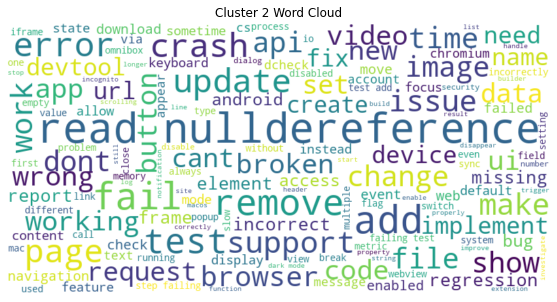

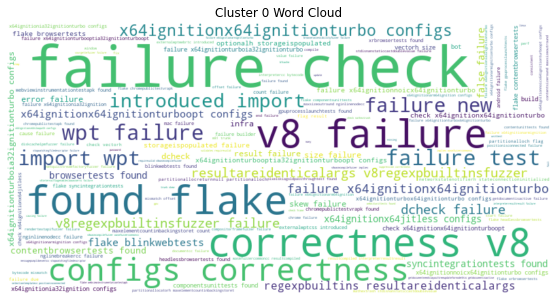

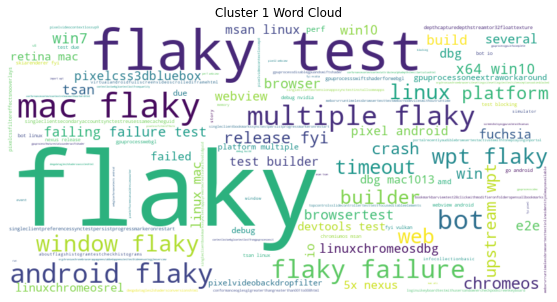

In [12]:
from sklearn.cluster import KMeans
from wordcloud import WordCloud
import matplotlib.pyplot as plt


# Create a dictionary to store the documents in each cluster
cluster_docs = {}
for i, label in enumerate(cluster_labels):
    if label not in cluster_docs:
        cluster_docs[label] = []
    cluster_docs[label].append(i)

# Create word cloud for each cluster
for label, doc_indices in cluster_docs.items():
    # Retrieve the words from the TfidfVectorizer object
    cluster_words = " ".join(feature_names[i] for i in tfidf_matrix[doc_indices].nonzero()[1])

    # Check if cluster contains at least one document with words
    if cluster_words:
        # Create a WordCloud object
        wordcloud = WordCloud(width=800, height=400, max_words=150, background_color='white').generate(cluster_words)

        # Plot the WordCloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Cluster {label} Word Cloud')
        plt.axis('off')
        plt.show()
    else:
        print(f"No documents with words in Cluster {label}")



In [13]:
from sklearn.cluster import KMeans

# set number of clusters
n_clusters = 3

# create KMeans clustering object
kmeans = KMeans(n_clusters=n_clusters, random_state=49)

# fit KMeans clustering model to the tfidf_matrix
kmeans.fit(tfidf_matrix)

# get cluster labels for each row in the tfidf_matrix
df3['cluster_labels'] = kmeans.labels_

# print number of rows in each cluster
unique, counts = np.unique(cluster_labels, return_counts=True)
print(dict(zip(unique, counts)))


{0: 4670, 1: 9276, 2: 85782}


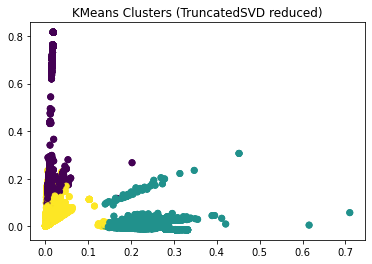

In [14]:
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD

# Reduce the dimensionality of tfidf matrix using TruncatedSVD
svd = TruncatedSVD(n_components=3)
tfidf_matrix_reduced = svd.fit_transform(tfidf_matrix)

# Plot the documents in 2D space, coloring the points according to their cluster labels
plt.scatter(tfidf_matrix_reduced[:, 0], tfidf_matrix_reduced[:, 1], c=cluster_labels)
plt.title("KMeans Clusters (TruncatedSVD reduced)")
plt.show()



In [15]:
# Get the feature names from the TfidfVectorizer
feature_names = vectorizer.get_feature_names()

# Get the centroid vectors for each cluster
centroids = km.cluster_centers_

# Get the indices of the most important features for each cluster
important_indices = centroids.argsort()[:, ::-1]

# Get the most important words for each cluster
num_words = 15
cluster_labels = {}
for i in range(num_clusters):
    label = f"Cluster {i+1}: "
    for j in range(num_words):
        label += feature_names[important_indices[i][j]] + ", "
    cluster_labels[i] = label[:-2]

# Print the cluster labels
for i, label in cluster_labels.items():
    print(label)


Cluster 1: failure, check, flake, found, correctness, configs, v8, x64ignitionx64ignitionturbo, wpt, dcheck, introduced, import, test, false, blinkwebtests
Cluster 2: flaky, test, mac, linux, bot, multiple, android, platform, wpt, failure, builder, tsan, window, upstream, dbg
Cluster 3: chrome, test, window, page, crash, read, add, failing, file, nulldereference, error, work, fails, screen, mode


C:\Users\yousu\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
#labels_map = {0: "Browser Functionality", 1: "Flaky Test Bugs", 2: "Crash Bugs"}
#df4['cluster_labels'] = df4['cluster_labels'].replace(labels_map)
df4.tail(70)

In [16]:
df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds,lemmatized_wrds,lemmatized_str,cluster_labels
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,...","[mohnstrudel, a11y, keyboard, focus, ring, tab...","[mohnstrudel, a11y, keyboard, focus, ring, tab...",mohnstrudel a11y keyboard focus ring tab count...,0
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,...","[sheriffomatic, longer, show, m85, builders, ]","[sheriffomatic, longer, show, m85, builder, ]",sheriffomatic longer show m85 builder,0
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frame]",fps meter isnt capturing dropped frame,0
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]","[add, chromeflags, entry, iph, snooze]","[add, chromeflags, entry, iph, snooze]",add chromeflags entry iph snooze,0
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not...","[second, row, new, tab, page, buttons, clickable]","[second, row, new, tab, page, button, clickable]",second row new tab page button clickable,0
...,...,...,...,...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...",compile failure observing compile failure linu...,0
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,...","[change, precedence, commandlinefeatures, alig...","[change, precedence, commandlinefeatures, alig...",change precedence commandlinefeatures align ex...,0
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,...","[add, test, backdropfilter, null, crop, rect]","[add, test, backdropfilter, null, crop, rect]",add test backdropfilter null crop rect,0
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]",dl beforeactivate commits dcheck,0


In [20]:
# Assuming df4 is the existing DataFrame and cluster_labels is the dictionary with cluster labels

# Create the cluster columns with empty values
df3['cluster1'] = ''
df3['cluster2'] = ''
df3['cluster3'] = ''

# Populate the cluster columns based on the existence of cluster words in the summary
for i in range(len(df3)):
    summary = df3.loc[i, 'summary']
    if pd.notna(summary):  # Check for missing values (NaN)
        for j in range(num_clusters):
            cluster_words = cluster_labels[j].replace(f"Cluster {j+1}: ", "").split(", ")
            for word in cluster_words:
                if word.lower() in summary.lower():
                    if j == 0:
                        df3.loc[i, 'cluster1'] += f"{word}, "
                    elif j == 1:
                        df3.loc[i, 'cluster2'] += f"{word}, "
                    elif j == 2:
                        df3.loc[i, 'cluster3'] += f"{word}, "

# Remove trailing commas from the cluster columns
df3['cluster1'] = df3['cluster1'].str.rstrip(", ")
df3['cluster2'] = df3['cluster2'].str.rstrip(", ")
df3['cluster3'] = df3['cluster3'].str.rstrip(", ")

# Print the updated DataFrame
print(df3)


       Unnamed: 0   bug_id                                        component  \
0               0  1136185  UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip   
1               1  1136184                   Infra>Sheriffing>SheriffOMatic   
2               2  1136183                                    Speed>Metrics   
3               3  1136181                                 UI>Browser>Promo   
4               4  1136179                            UI>Browser>NewTabPage   
...           ...      ...                                              ...   
99723       99723   987797     UI>Accessibility, OS>Accessibility>ChromeVox   
99724       99724   987788                                   Mobile>WebView   
99725       99725   987750                                      Blink>Paint   
99726       99726   987730                                      Blink>Paint   
99727       99727   987686                                     Blink>WebOTP   

                                                 su

In [21]:
df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds,lemmatized_wrds,lemmatized_str,cluster_labels,cluster1,cluster2,cluster3
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,...","[mohnstrudel, a11y, keyboard, focus, ring, tab...","[mohnstrudel, a11y, keyboard, focus, ring, tab...",mohnstrudel a11y keyboard focus ring tab count...,0,,,
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,...","[sheriffomatic, longer, show, m85, builders, ]","[sheriffomatic, longer, show, m85, builder, ]",sheriffomatic longer show m85 builder,0,,builder,
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frame]",fps meter isnt capturing dropped frame,0,,,
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]","[add, chromeflags, entry, iph, snooze]","[add, chromeflags, entry, iph, snooze]",add chromeflags entry iph snooze,0,,,"chrome, add"
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not...","[second, row, new, tab, page, buttons, clickable]","[second, row, new, tab, page, button, clickable]",second row new tab page button clickable,0,,,page
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...",compile failure observing compile failure linu...,0,failure,"linux, failure, builder",
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,...","[change, precedence, commandlinefeatures, alig...","[change, precedence, commandlinefeatures, alig...",change precedence commandlinefeatures align ex...,0,,,
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,...","[add, test, backdropfilter, null, crop, rect]","[add, test, backdropfilter, null, crop, rect]",add test backdropfilter null crop rect,0,test,test,"test, add"
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]",dl beforeactivate commits dcheck,0,"check, dcheck",,


In [22]:
# Create the 'common_words' column
df3['common_words'] = ''

# Iterate over each row
for i, row in df3.iterrows():
    # Get the values from cluster columns
    cluster1_words = row['cluster1'].split(", ")
    cluster2_words = row['cluster2'].split(", ")
    cluster3_words = row['cluster3'].split(", ")

    # Initialize a list to store common words
    common_words = []

    # Check for common words between cluster1 and cluster2
    for word1 in cluster1_words:
        for word2 in cluster2_words:
            if word1 == word2:
                # Add the common word to the list
                common_words.append(word1)

    # Check for common words between cluster1 and cluster3
    for word1 in cluster1_words:
        for word3 in cluster3_words:
            if word1 == word3:
                # Add the common word to the list
                common_words.append(word1)

    # Check for common words between cluster2 and cluster3
    for word2 in cluster2_words:
        for word3 in cluster3_words:
            if word2 == word3:
                # Add the common word to the list
                common_words.append(word2)

    # Remove duplicate words from the common_words list
    common_words = list(set(common_words))

    # Populate the 'common_words' column
    df3.at[i, 'common_words'] = ", ".join(common_words)

# Print the updated DataFrame
print(df3)



       Unnamed: 0   bug_id                                        component  \
0               0  1136185  UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip   
1               1  1136184                   Infra>Sheriffing>SheriffOMatic   
2               2  1136183                                    Speed>Metrics   
3               3  1136181                                 UI>Browser>Promo   
4               4  1136179                            UI>Browser>NewTabPage   
...           ...      ...                                              ...   
99723       99723   987797     UI>Accessibility, OS>Accessibility>ChromeVox   
99724       99724   987788                                   Mobile>WebView   
99725       99725   987750                                      Blink>Paint   
99726       99726   987730                                      Blink>Paint   
99727       99727   987686                                     Blink>WebOTP   

                                                 su

In [28]:
df3.drop(['msg_clean','summary_tokenized','no_swds','lemmatized_wrds'],axis=1)

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,lemmatized_str,cluster_labels,cluster1,cluster2,cluster3,common_words
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y keyboard focus ring tab count...,0,,,,
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic longer show m85 builder,0,,builder,,
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frame,0,,,,
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry iph snooze,0,,,"chrome, add",
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row new tab page button clickable,0,,,page,
...,...,...,...,...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure linu...,0,failure,"linux, failure, builder",,failure
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence commandlinefeatures align ex...,0,,,,
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add test backdropfilter null crop rect,0,test,test,"test, add",test
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,0,"check, dcheck",,,


In [31]:
# Filter rows where common_words column is not empty and not just empty spaces
df3 = df3[df3['common_words'].str.strip() != '']

# Sort the DataFrame by common_words column in alphabetical order
df3 = df3.sort_values(by='common_words')

df3


,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds,lemmatized_wrds,lemmatized_str,cluster_labels,cluster1,cluster2,cluster3,common_words
26199,26199,1070914,Blink>Editing>Command,check failure: start_position.compareto(end_po...,188,blink,check failure startpositioncomparetoendpositio...,"[check, failure, startpositioncomparetoendposi...","[check, failure, startpositioncomparetoendposi...","[check, failure, startpositioncomparetoendposi...",check failure startpositioncomparetoendpositio...,0,"failure, check",failure,,failure
96081,96081,1000945,"Blink>CSS, Blink>Animation",check failure: std::abs(delta) < kslack in css...,188,blink,check failure stdabsdelta kslack in csslength...,"[check, failure, stdabsdelta, kslack, in, cssl...","[check, failure, stdabsdelta, kslack, csslengt...","[check, failure, stdabsdelta, kslack, csslengt...",check failure stdabsdelta kslack csslengthinte...,0,"failure, check",failure,,failure
12627,12627,1119295,Infra>Sheriffing>SheriffOMatic,sheriff o matic keeps showing failure of remov...,125,infra,sheriff o matic keeps showing failure of remov...,"[sheriff, o, matic, keeps, showing, failure, o...","[sheriff, matic, keeps, showing, failure, remo...","[sheriff, matic, keep, showing, failure, remov...",sheriff matic keep showing failure removed bui...,0,failure,"failure, builder",,failure
42951,42951,1012582,Blink>Canvas,check failure: !resourceprovider() || !hasplac...,188,blink,check failure resourceprovider hasplaceholder...,"[check, failure, resourceprovider, hasplacehol...","[check, failure, resourceprovider, hasplacehol...","[check, failure, resourceprovider, hasplacehol...",check failure resourceprovider hasplaceholderc...,0,"failure, check",failure,,failure
70179,70179,1091958,Internals>GPU,check whether disabling direct composition or ...,193,gpu,check whether disabling direct composition or ...,"[check, whether, disabling, direct, compositio...","[check, whether, disabling, direct, compositio...","[check, whether, disabling, direct, compositio...",check whether disabling direct composition ove...,0,"failure, check",failure,,failure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34359,34359,1042848,Blink>MediaStream,virtual/audio-service/external/wpt/mediacaptur...,188,blink,virtualaudioserviceexternalwptmediacapturestre...,[virtualaudioserviceexternalwptmediacapturestr...,[virtualaudioserviceexternalwptmediacapturestr...,[virtualaudioserviceexternalwptmediacapturestr...,virtualaudioserviceexternalwptmediacapturestre...,1,wpt,"flaky, wpt, window",window,"wpt, window"
20968,20968,1090484,Blink>Infra>Ecosystem,external/wpt/compat/idlharness.window.html is ...,125,infra,externalwptcompatidlharnesswindowhtml is flaky,"[externalwptcompatidlharnesswindowhtml, is, fl...","[externalwptcompatidlharnesswindowhtml, flaky]","[externalwptcompatidlharnesswindowhtml, flaky]",externalwptcompatidlharnesswindowhtml flaky,1,wpt,"flaky, wpt, window",window,"wpt, window"
77836,77836,1064315,Blink>Network>FetchAPI,virtual/omt-worker-fetch/external/wpt/fetch/or...,188,blink,virtualomtworkerfetchexternalwptfetchoriginass...,[virtualomtworkerfetchexternalwptfetchoriginas...,[virtualomtworkerfetchexternalwptfetchoriginas...,[virtualomtworkerfetchexternalwptfetchoriginas...,virtualomtworkerfetchexternalwptfetchoriginass...,1,wpt,"flaky, wpt, window","window, work","wpt, window"
84014,84014,1042848,Blink>MediaStream,virtual/audio-service/external/wpt/mediacaptur...,188,blink,virtualaudioserviceexternalwptmediacapturestre...,[virtualaudioserviceexternalwptmediacapturestr...,[virtualaudioserviceexternalwptmediacapturestr...,[virtualaudioserviceexternalwptmediacapturestr...,virtualaudioserviceexternalwptmediacapturestre...,1,wpt,"flaky, wpt, window",window,"wpt, window"


In [32]:
df3.to_csv('ch_output1.csv', index=False)

In [33]:
df5=pd.read_csv('ch_output1.csv')

In [35]:
df5.drop(['msg_clean','summary_tokenized','no_swds','lemmatized_wrds'],axis=1)

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,lemmatized_str,cluster_labels,cluster1,cluster2,cluster3,common_words
0,26199,1070914,Blink>Editing>Command,check failure: start_position.compareto(end_po...,188,blink,check failure startpositioncomparetoendpositio...,0,"failure, check",failure,NaN,failure
1,96081,1000945,"Blink>CSS, Blink>Animation",check failure: std::abs(delta) < kslack in css...,188,blink,check failure stdabsdelta kslack csslengthinte...,0,"failure, check",failure,NaN,failure
2,12627,1119295,Infra>Sheriffing>SheriffOMatic,sheriff o matic keeps showing failure of remov...,125,infra,sheriff matic keep showing failure removed bui...,0,failure,"failure, builder",NaN,failure
3,42951,1012582,Blink>Canvas,check failure: !resourceprovider() || !hasplac...,188,blink,check failure resourceprovider hasplaceholderc...,0,"failure, check",failure,NaN,failure
4,70179,1091958,Internals>GPU,check whether disabling direct composition or ...,193,gpu,check whether disabling direct composition ove...,0,"failure, check",failure,NaN,failure
...,...,...,...,...,...,...,...,...,...,...,...,...
24373,34359,1042848,Blink>MediaStream,virtual/audio-service/external/wpt/mediacaptur...,188,blink,virtualaudioserviceexternalwptmediacapturestre...,1,wpt,"flaky, wpt, window",window,"wpt, window"
24374,20968,1090484,Blink>Infra>Ecosystem,external/wpt/compat/idlharness.window.html is ...,125,infra,externalwptcompatidlharnesswindowhtml flaky,1,wpt,"flaky, wpt, window",window,"wpt, window"
24375,77836,1064315,Blink>Network>FetchAPI,virtual/omt-worker-fetch/external/wpt/fetch/or...,188,blink,virtualomtworkerfetchexternalwptfetchoriginass...,1,wpt,"flaky, wpt, window","window, work","wpt, window"
24376,84014,1042848,Blink>MediaStream,virtual/audio-service/external/wpt/mediacaptur...,188,blink,virtualaudioserviceexternalwptmediacapturestre...,1,wpt,"flaky, wpt, window",window,"wpt, window"
